In [1]:
import numpy as np
import matplotlib.pyplot as plt
import cv2
from skimage import transform

In [2]:
def imshows(images, titles=[], size=None, clean=False, suptitle=''):
    """Show images, with titles (optional)"""

    assert isinstance(images, list), 'Images must be list'
    assert isinstance(titles, list), 'Titles must be list'
    assert len(images) != 1, 'Use imshow() instead'
    if size:
        try:
            assert isinstance(size, list) or isinstance(size, tuple)
            assert len(size) == 2
            assert len(images) == size[0] * size[1]
        except:
            raise AssertionError('Invalid size')

    if size:
        fig, axes = plt.subplots(
            size[0], size[1], figsize=(size[1]*8, size[0]*5)
        )
    else: 
        fig, axes = plt.subplots(1, len(images), figsize=(15,15))
        for i, image in enumerate(images):
            if(len(image.shape) == 3):
                axes[i].imshow(image)
            else:
                axes[i].imshow(image, plt.cm.gray)
            if titles:
                axes[i].set_title(titles[i])

    for i, (ax, image) in enumerate(zip(axes.flatten(), images)):
        if(len(image.shape) == 3):
            ax.imshow(image)
        else:
            ax.imshow(image, plt.cm.gray)
        if titles:
            ax.set_title(titles[i])
        if clean:
            ax.set_xticks([])
            ax.set_yticks([])
    if suptitle:
        plt.suptitle(suptitle)

    plt.show()

def imshow(image, title='', figsize=None):
    """Show image, with title (optional)"""

    if figsize:
        plt.figure(figsize=figsize)
    if(len(image.shape) == 3):
        plt.imshow(image)
    else:
        plt.imshow(image, plt.cm.gray)
    if title:
        plt.title(title)

    plt.show()

def gray(image):
    """Return grayscale image"""
    
    return cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)

def hsv(image):
    """Return HSV image"""

    return cv2.cvtColor(image, cv2.COLOR_RGB2HSV)

# Bài 1

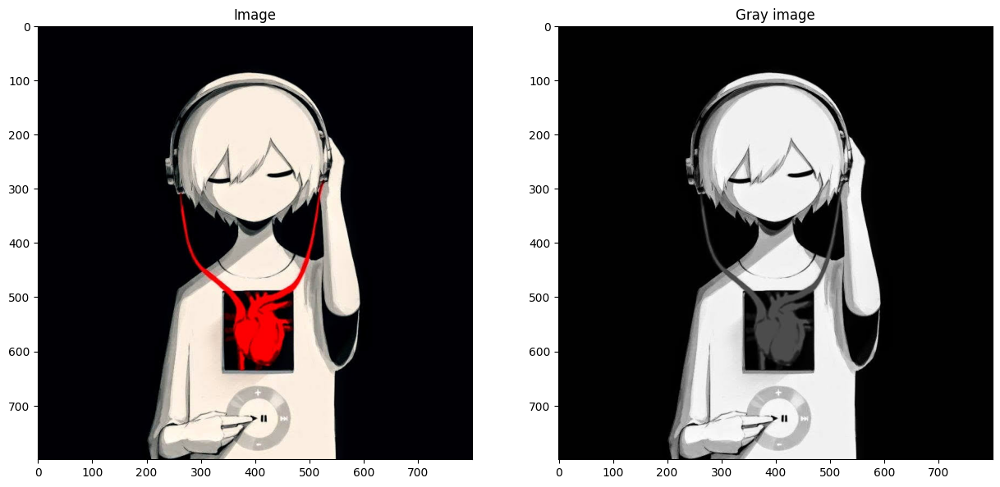

In [3]:
img = plt.imread('images/boi.jpg')
img_gray = gray(img)
imshows([img, img_gray], titles=['Image', 'Gray image'])

## Scaling

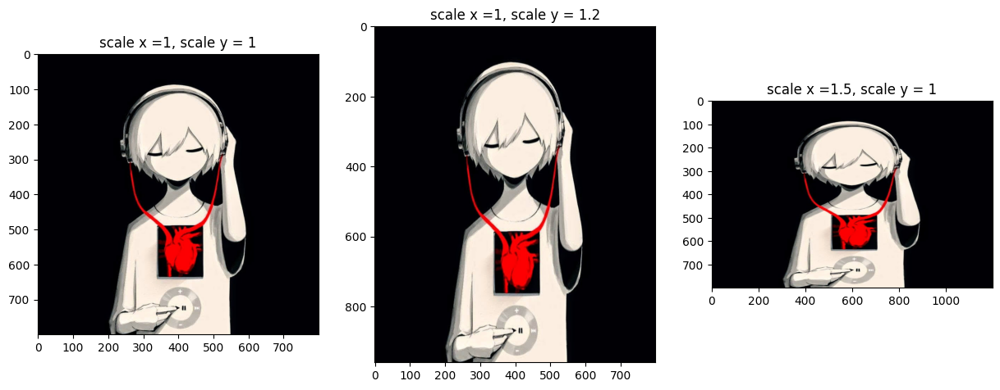

In [4]:
scales = [(1, 1), (1, 1.2), (1.5, 1)]
imshows([cv2.resize(img, None, fx=x, fy=y) for (x, y) in scales], 
        titles=[f'scale x ={scale[0]}, scale y = {scale[1]}' 
                for scale in scales])

## Rotation

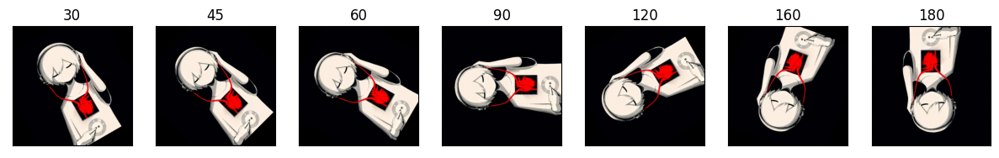

In [5]:
angles = [30, 45, 60, 90, 120, 160, 180]
titles = [angle for angle in angles]
rotated_list = [transform.rotate(img, angle) for angle in angles]
imshows(rotated_list, titles=titles, clean=True)

## Translation

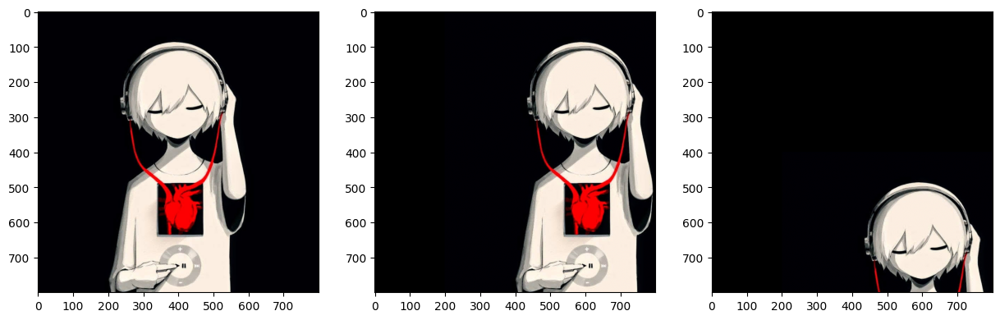

In [6]:
def translation(img, x, y):
    transformation_matrix = transform.AffineTransform(
        translation=(-x, -y)    # skimage behave different from opencv
    )
    return transform.warp(img, transformation_matrix)

imshows([img, translation(img, 200, 0), translation(img, 200, 400)])

## Shearing

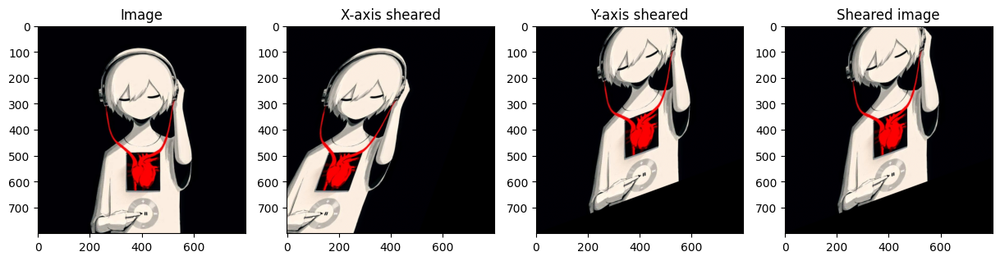

In [7]:
def shearing(img, x=0, y=0):
    transformation_matrix = transform.AffineTransform(
        shear=(-np.radians(x), -np.radians(y)))

    return transform.warp(img, transformation_matrix)

imshows([img, shearing(img, x=20), shearing(img, y=20), shearing(img, 0, 20)],
        titles=['Image', 'X-axis sheared', 'Y-axis sheared', 'Sheared image'])

## Rigid motion/Euclidian transformation

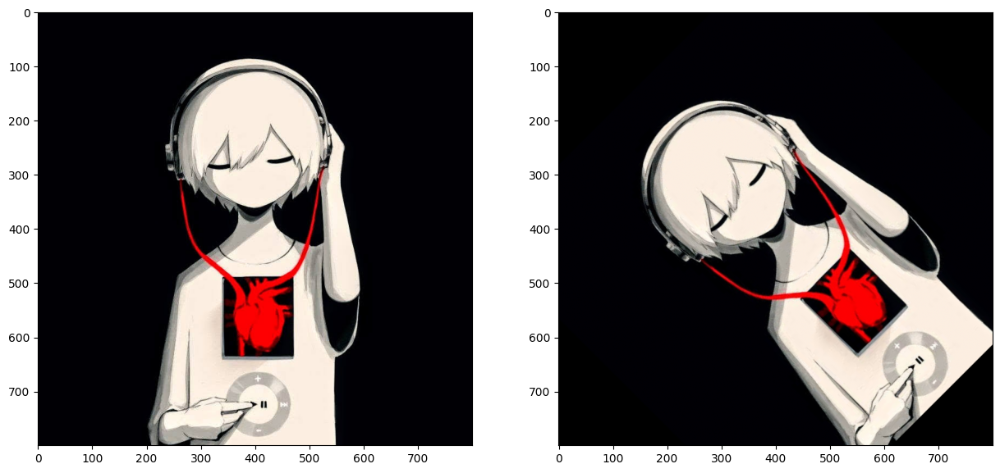

In [8]:
transformed = transform.warp(
    img, transform.EuclideanTransform(
        rotation=np.radians(45), translation=(img.shape[0]/2, -200)
    )
)
imshows([img, transformed])

## Similarity Transformation

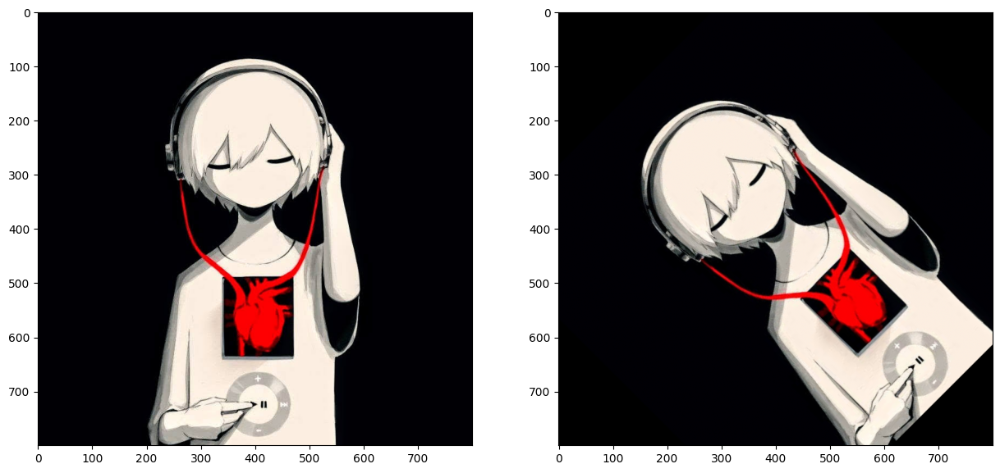

In [9]:
transformed = transform.warp(
    img, transform.SimilarityTransform(
        scale=1, rotation=np.radians(45), translation=(img.shape[0]/2, -200)
    )
)
imshows([img, transformed])

## Affine transformation

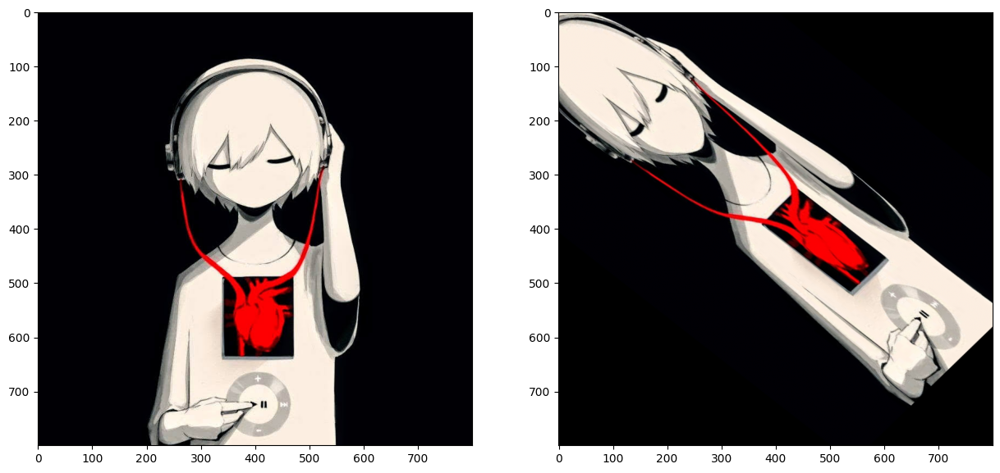

In [10]:
transformed = transform.warp(
    img, transform.AffineTransform(
        scale=1, rotation=np.radians(30), 
        shear=np.radians(35), translation=(450, 100)
    )
)
imshows([img, transformed])

# Bài 2

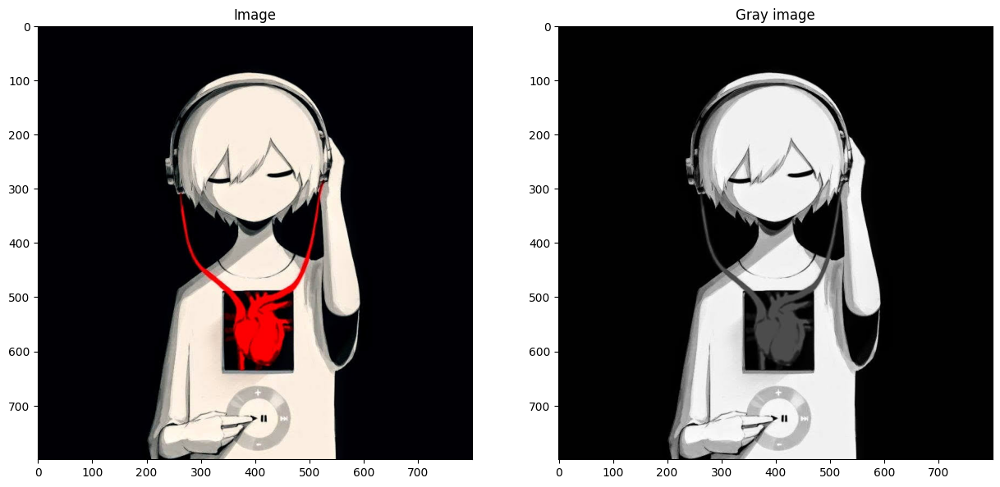

In [11]:
img = plt.imread('images/boi.jpg')
img_gray = gray(img)
imshows([img, img_gray], titles=['Image', 'Gray image'])

## Scaling

In [12]:
def rescale(img, scale_x, scale_y=None):
    if not scale_y:
        scale_y = scale_x

    (h, w) = img.shape[:2]
    transformation_matrix = np.float32([
        [scale_x, 0, 0],
        [0, scale_y, 0]
    ])
    
    return cv2.warpAffine(
        img, transformation_matrix, (int(w*scale_x), int(h*scale_y))
    )

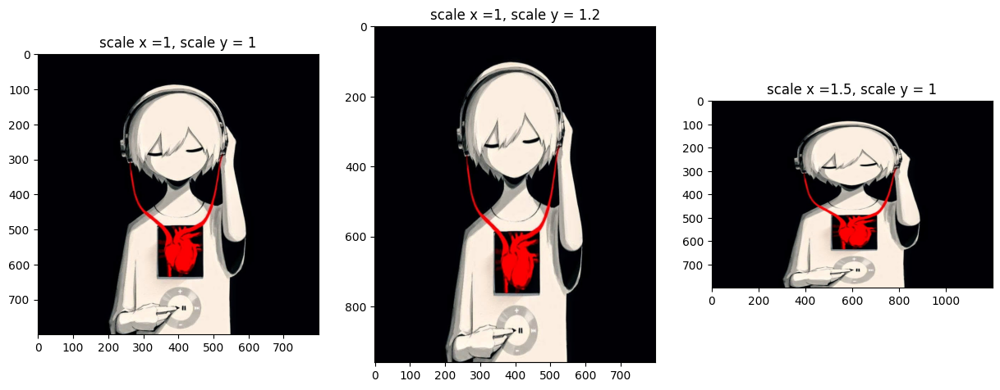

In [13]:
scales = [(1, 1), (1, 1.2), (1.5, 1)]
imshows([rescale(img, x, y) for (x, y) in scales], 
        titles=[f'scale x ={scale[0]}, scale y = {scale[1]}' 
                for scale in scales])

## Rotation

In [14]:
def rotate(img, angle, center=None, scale=1.0):
    (h, w) = img.shape[:2]
    if not center:
        center = (w//2, h//2)

    transformation_matrix = cv2.getRotationMatrix2D(center, angle, scale)
    return cv2.warpAffine(img, transformation_matrix, (w, h))

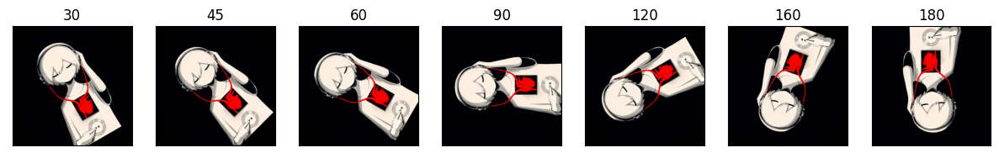

In [15]:
angles = [30, 45, 60, 90, 120, 160, 180]
titles = [angle for angle in angles]
rotated_list = [rotate(img, angle) for angle in angles]
imshows(rotated_list, titles=titles, clean=True)

## Translation

In [16]:
def translate(img, x=0, y=0):
    # skimage way, but it different from opencv way
    # translation_matrix = np.array([
    #     [1, 0, x], 
    #     [0, 1, y],
    #     [0, 0, 1]])
    # translated = transform.warp(img, translation_matrix)

    (h, w) = img.shape[:2]
    translation_matrix = np.float32([
        [1, 0, x], 
        [0, 1, y]])

    return cv2.warpAffine(img, translation_matrix, (w, h))

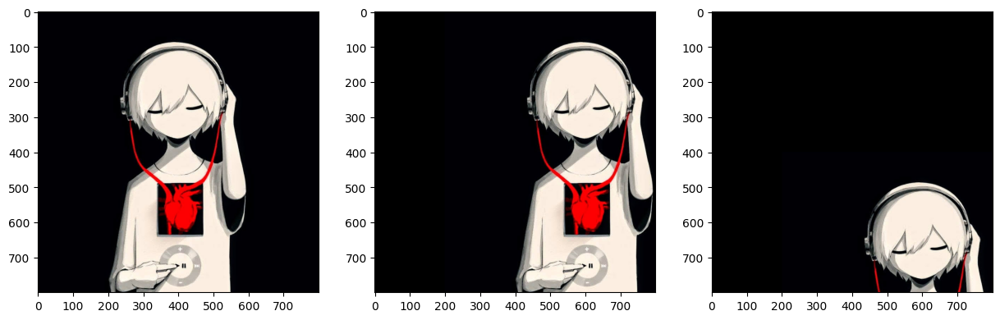

In [17]:
imshows([img, translate(img, 200, 0), translate(img, 200, 400)])

## Shearing

In [18]:
def shear(img, x, y):
    shear_matrix = np.array([
        [1, x, 0], 
        [y, 1, 0],
        [0, 0, 1]])

    return transform.warp(img, shear_matrix)

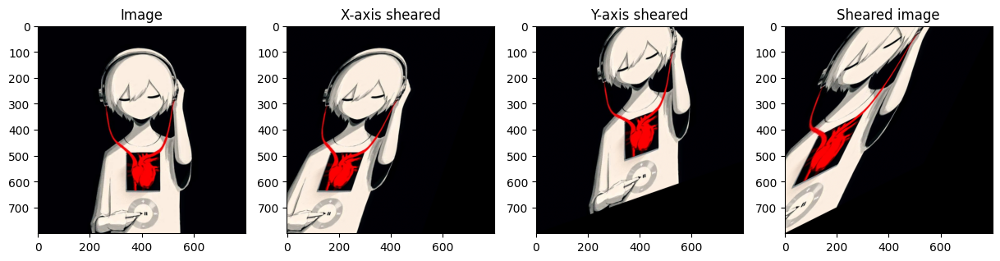

In [19]:
imshows(
    [img, shear(img, np.radians(20), 0), 
     shear(img, 0, np.radians(20)), shear(img, 0.5, 0.5)], 
    titles=['Image', 'X-axis sheared', 'Y-axis sheared', 'Sheared image'])

## Reflection

Using OpenCV

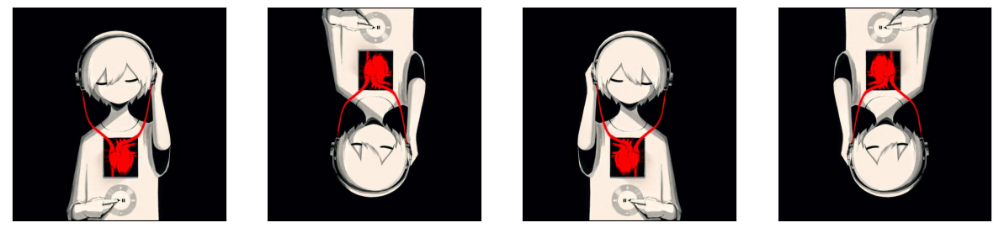

In [20]:
imshows([img, cv2.flip(img, 0), cv2.flip(img, 1), cv2.flip(img, -1)], clean=True)

Using matrix transformation

In [21]:
def reflect(img, axis):
    (h, w) = img.shape[:2]
    if axis == 'x':
        transformation_matrix = np.float32([
            [1, 0, 0],
            [0, -1, h],
            [0, 0, 1]
        ])
    elif axis == 'y':
        transformation_matrix = np.float32([
            [-1, 0, w],
            [0, 1, 0],
            [0, 0, 1]
        ])
        
    return cv2.warpPerspective(img, transformation_matrix, (w, h))

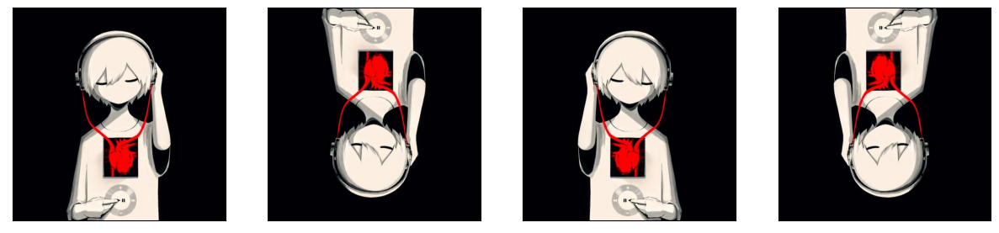

In [22]:
imshows([img, reflect(img, axis='x'), reflect(img, axis='y'),
         reflect(reflect(img, axis='x'), axis='y'),], clean=True)

## ORB feature detector

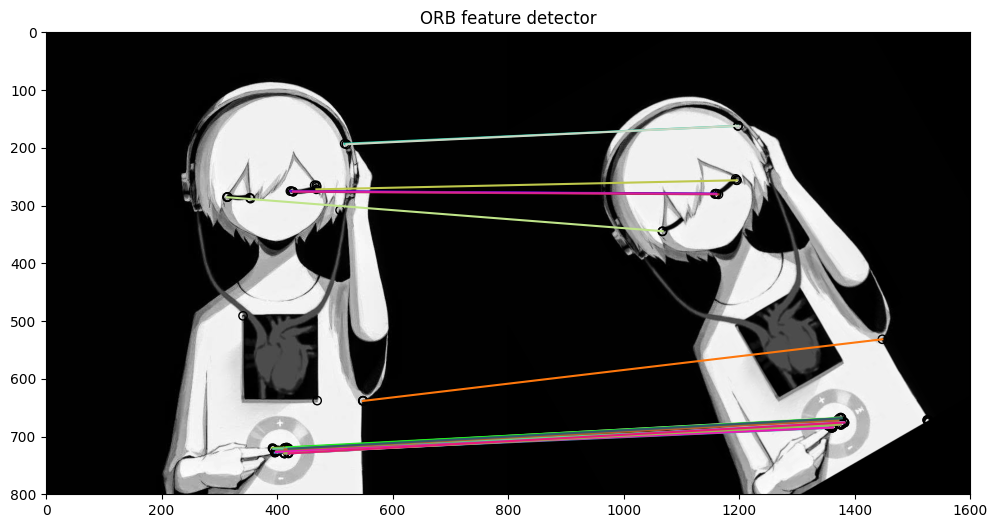

In [23]:
from skimage import feature

img_rotated = rotate(img_gray, 30)

# Detect ORB keypoints and descriptors
detector1 = feature.ORB(n_keypoints=50)
detector2 = feature.ORB(n_keypoints=50)
detector1.detect_and_extract(img_gray)
detector2.detect_and_extract(img_rotated)
keypoints1, descriptors1 = detector1.keypoints, detector1.descriptors
keypoints2, descriptors2 = detector2.keypoints, detector2.descriptors

# Match keypoints
matches = feature.match_descriptors(descriptors1, descriptors2)

# Visualize the matches
fig, ax = plt.subplots(nrows=1, ncols=1, figsize=(12, 6))
feature.plot_matches(ax, img_gray, img_rotated, keypoints1, keypoints2, matches)
plt.title('ORB feature detector')
plt.show()


# Bài 3

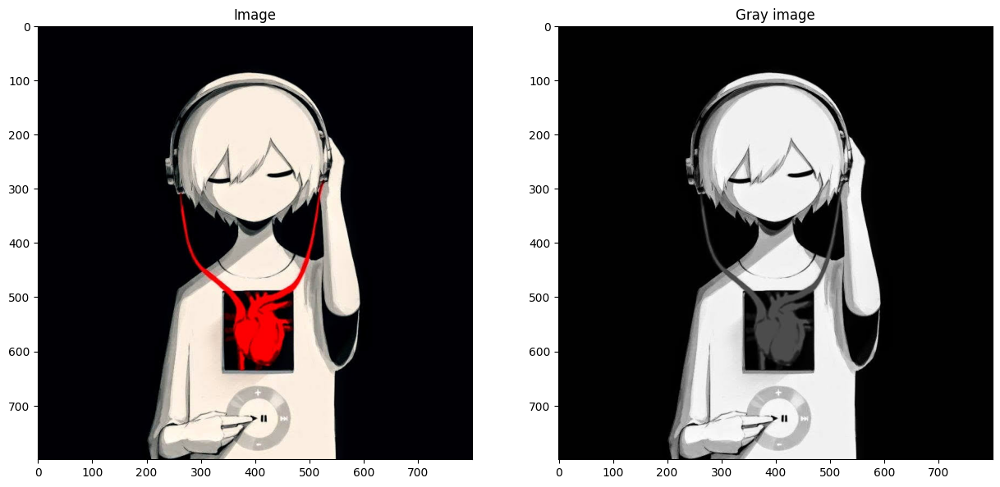

In [24]:
img = plt.imread('images/boi.jpg')
img_gray = gray(img)
imshows([img, img_gray], titles=['Image', 'Gray image'])

In [25]:
# Scaling matrix
scale = 1.2
scale_matrix = np.array([
    [scale, 0, 0], 
    [0, scale, 0],
    [0, 0, 1]])

# Rotation matrix
angle = 45
h, w = img.shape[:2]
center = (w//2, h//2)
rotation_matrix = cv2.getRotationMatrix2D(center, angle, 1)
rotation_matrix = np.concatenate((rotation_matrix, [[0, 0, 1]]))

# Shearing matrix
shear_x, shear_y = np.radians(20), np.radians(0)
shearing_matrix = np.array([
    [1, shear_x, 0], 
    [shear_y, 1, 0],
    [0, 0, 1]])

## Scaling -> Rotation

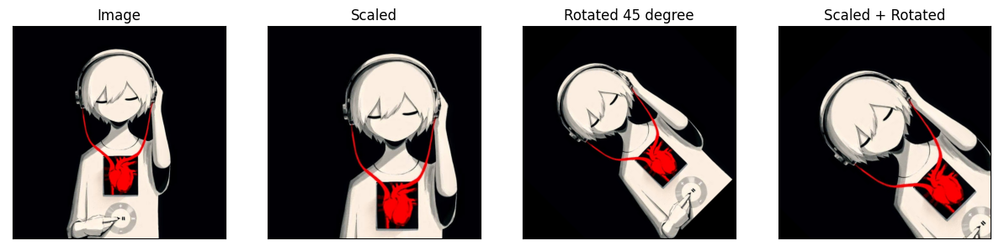

In [26]:
transformation_matrix = np.dot(scale_matrix, rotation_matrix)
scaled_rotated = cv2.warpAffine(img, transformation_matrix[:2, :], (w, h))

imshows([img, 
        cv2.warpAffine(img, scale_matrix[:2, :], (w, h)),
        cv2.warpAffine(img, rotation_matrix[:2, :], (w, h)),
        scaled_rotated],
        titles=[
            'Image', 'Scaled', f'Rotated {angle} degree', 'Scaled + Rotated'
        ], clean=True)

## Rotation -> Shearing

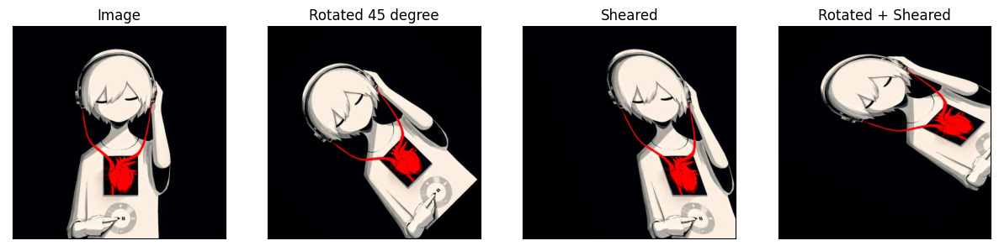

In [27]:
transformation_matrix = np.dot(rotation_matrix, shearing_matrix)
rotated_sheared = cv2.warpAffine(img, transformation_matrix[:2, :], (w, h))

imshows([img, 
        cv2.warpAffine(img, rotation_matrix[:2, :], (w, h)),
        cv2.warpAffine(img, shearing_matrix[:2, :], (w, h)),
        rotated_sheared],
        titles=[
            'Image', f'Rotated {angle} degree', 'Sheared', 'Rotated + Sheared'
        ], clean=True)

## Scaling -> Rotation -> Shearing

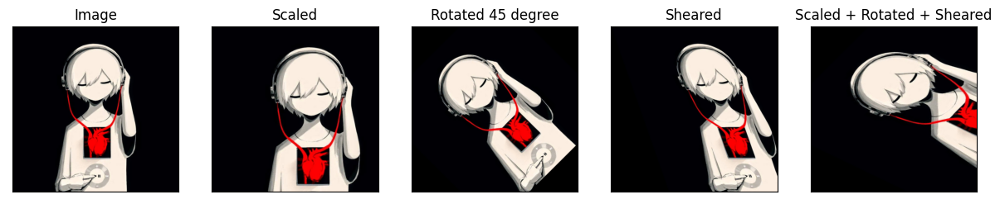

In [28]:
transformation_matrix = scale_matrix @ (rotation_matrix @ shearing_matrix)
scaled_rotated_sheared = cv2.warpAffine(
    img, transformation_matrix[:2, :], (w, h))

imshows([img, 
        cv2.warpAffine(img, scale_matrix[:2, :], (w, h)),
        cv2.warpAffine(img, rotation_matrix[:2, :], (w, h)),
        cv2.warpAffine(img, shearing_matrix[:2, :], (w, h)),
        scaled_rotated_sheared],
        titles=[
            'Image', 'Scaled', f'Rotated {angle} degree',
            'Sheared', 'Scaled + Rotated + Sheared'
        ], clean=True)

# Bài 4

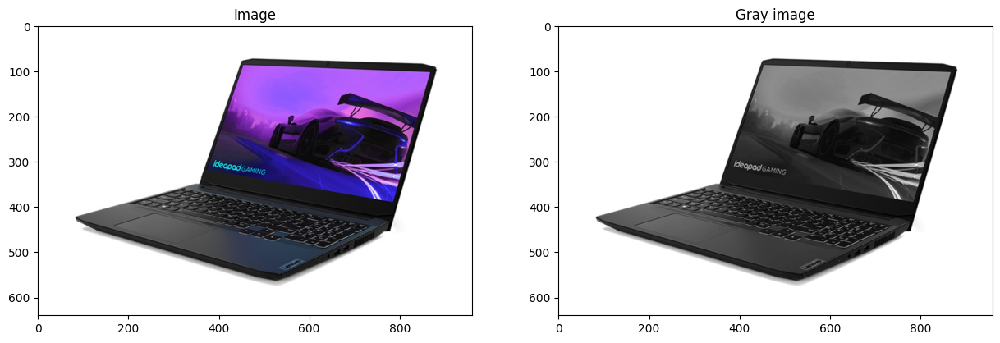

In [29]:
img = plt.imread('images/lenovo.jpg')
img_gray = gray(img)
imshows([img, img_gray], titles=['Image', 'Gray image'])

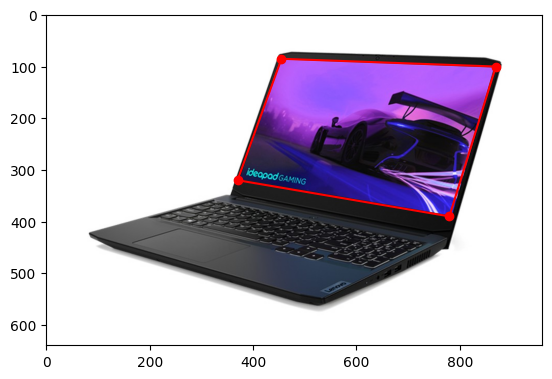

In [30]:
pts = np.float32([[455, 85], [870, 100], [780, 390], [370, 320]])
width  = int(pts[1][0] - pts[0][0])
height = int(pts[2][1] - pts[1][1])
dst = np.float32([[0, 0], [width, 0], [width, height], [0, height]])

square_pts = np.append(pts, [pts[0]], axis=0) # to draw rectangle
plt.imshow(img)
plt.scatter(pts[:, 0], pts[:, 1], c='r')
plt.plot(square_pts[:, 0], square_pts[:, 1], 'r')
plt.show()

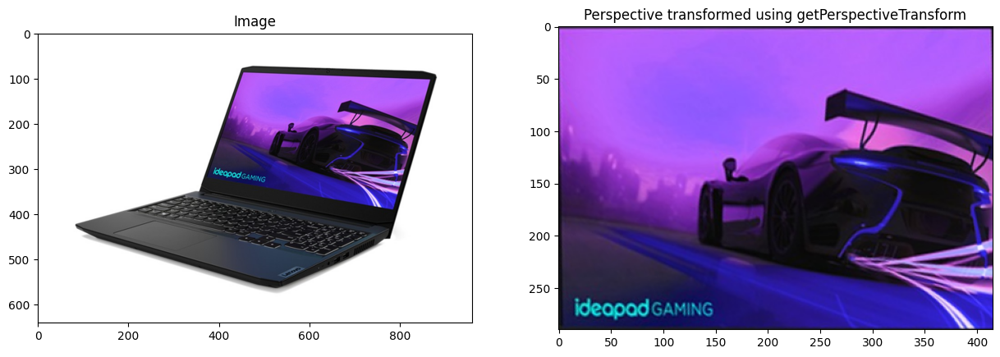

In [31]:
M = cv2.getPerspectiveTransform(pts, dst)
transformed = cv2.warpPerspective(img, M, (width, height))
imshows([img, transformed], 
        ['Image', 'Perspective transformed using getPerspectiveTransform'])

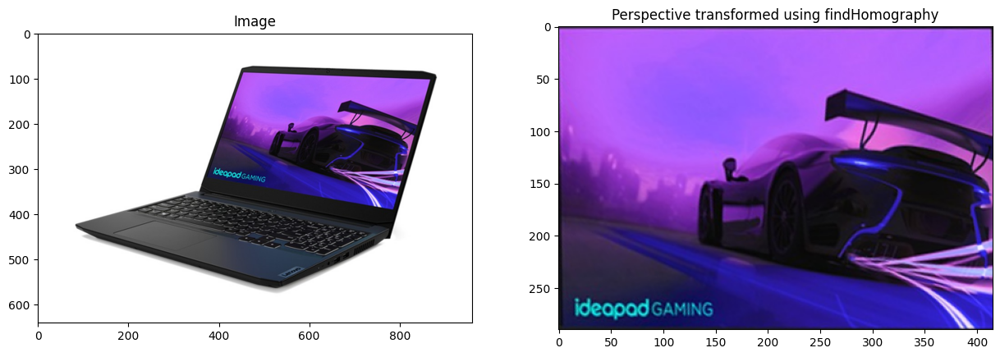

In [32]:
# Using findHomography function of OpenCV
homography_matrix, status = cv2.findHomography(pts, dst)
imshows([img, cv2.warpPerspective(img, homography_matrix, (width, height))],
        titles=['Image', 'Perspective transformed using findHomography'])

# Image stitching

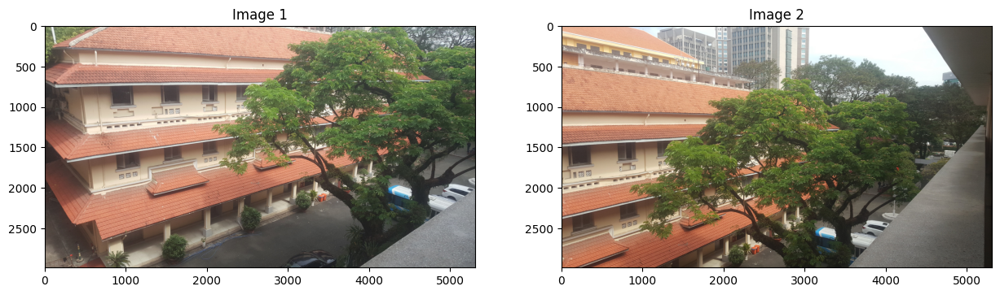

((2988, 5312, 3), (2988, 5312, 3))

In [33]:
img1 = plt.imread('images/hcmus1.jpg')
img2 = plt.imread('images/hcmus2.jpg')

scale_factor = 1
img1 = cv2.resize(img1, None, fx=scale_factor, fy=scale_factor)
img2 = cv2.resize(img2, None, fx=scale_factor, fy=scale_factor)
img1_gray = gray(img1)
img2_gray = gray(img2)

imshows([img1, img2], ['Image 1', 'Image 2'])
img1.shape, img2.shape

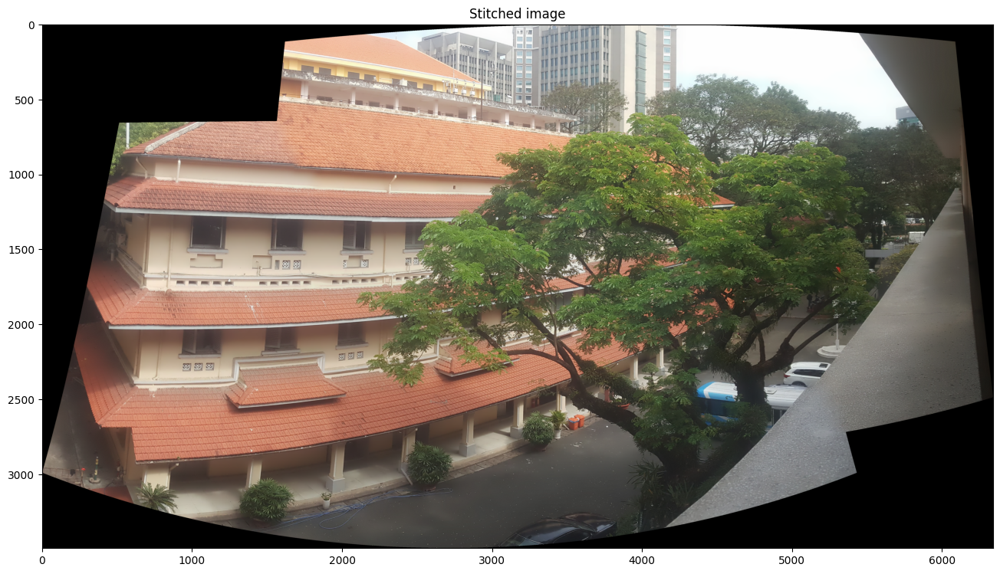

(3494, 6341, 3)

In [34]:
def stitch_images(img1, img2):
    stitcher = cv2.Stitcher_create()
    result, stitched_image = stitcher.stitch((img1, img2))

    if result == cv2.Stitcher_OK:
        return stitched_image
    
    raise Exception("Can't stitch images")

stitched = stitch_images(img1, img2)
imshow(stitched, 'Stitched image', figsize=(16,10))
stitched.shape

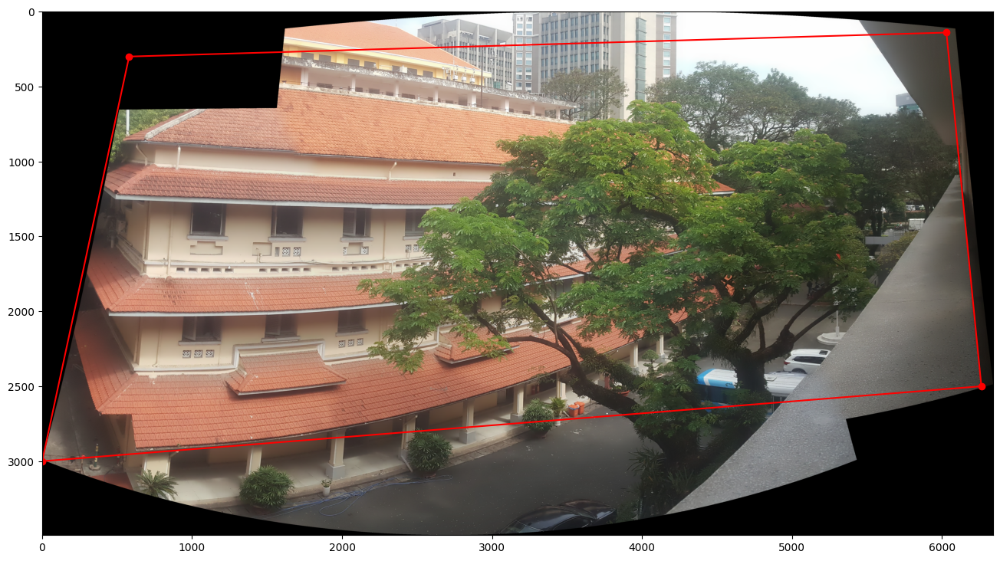

In [35]:
pts = np.float32([[580, 300], [6030, 140], [6263, 2500], [0, 3000]])
width  = int(max(pts[1][0] - pts[0][0], pts[2][0] - pts[3][0]))
height = int(max(pts[2][1] - pts[1][1], pts[3][1] - pts[0][1]))
dst = np.float32([[0, 0], [width, 0], [width, height], [0, height]])

square_pts = np.append(pts, [pts[0]], axis=0) # to draw rectangle

plt.figure(figsize=(16,10))
plt.imshow(stitched)
plt.scatter(pts[:, 0], pts[:, 1], c='r')
plt.plot(square_pts[:, 0], square_pts[:, 1], 'r')
plt.show()

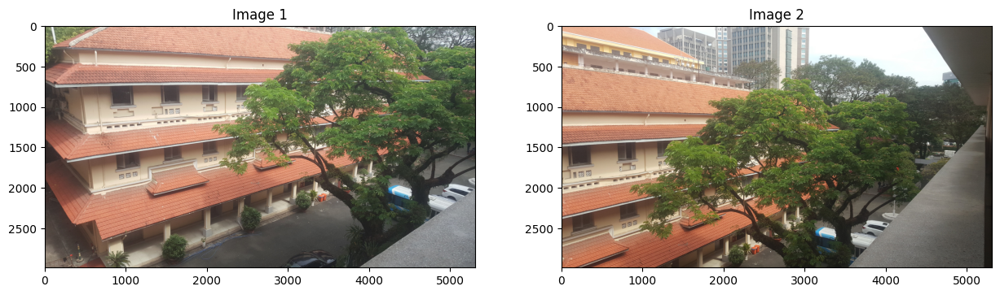

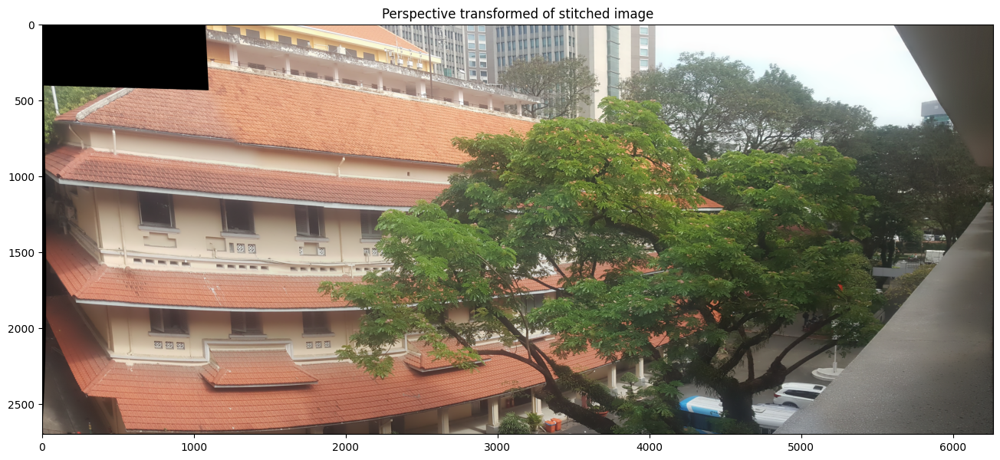

In [36]:
M = cv2.getPerspectiveTransform(pts, dst)
transformed = cv2.warpPerspective(stitched, M, (width, height))
imshows([img1, img2], ['Image 1', 'Image 2'])
imshow(transformed, 'Perspective transformed of stitched image', (16,10))